# Progetto **AutoEncoder**

In questo jupyter è stato progettato un anomaly autoencoder, ci troviamo nel caso in cui il dataset è sbilanciato avendo tante immagini normnali, quello che verrà fatto è lavorare sul reconstruction error. Il modello verrà addestrato su immagini normali e durante il training imparerà a ricostruire le immagini sempre meglio. Sulle Loss verrà stabilità poi la threshold da cui poi si stabilirà se un immagine è anomala oppure no, immagini anomale immaginiamo che avranno un errore maggiore.

# Importo tutti i package che mi serviranno

In [ ]:
#import packages
import numpy as np
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms.functional as TF
import torchvision.utils as vutils
from torchvision import models
from PIL import Image
import random
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
from torch.utils.data import DataLoader, random_split
from torchvision import datasets
from torchvision.transforms import ToTensor
from torchvision import transforms
from torch.autograd import Variable
import cv2
from sklearn.model_selection import KFold
import os
from typing import List, Tuple, Optional, Callable
import torch.nn.functional as F
from sklearn.metrics import f1_score
import seaborn as sns
from datetime import datetime

**Faccio la mount del Drive**

Da qui poi potrò prendere il mio dataset

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


# Creo la classe Dataset

È formata dai singoli percorsi per le immagini che compongono il dataset e le trasformazioni applicate.
Le immagini poi saranno etichettate come NORMALI(0) o ANOMALE(1) in base a quale sottodirectory appartengono.
Il pezzo sotto è servito a me per sapere se effettivamente il dataset veniva caricato correttamente prendendo un batch di esempio e la lunghezza

3960


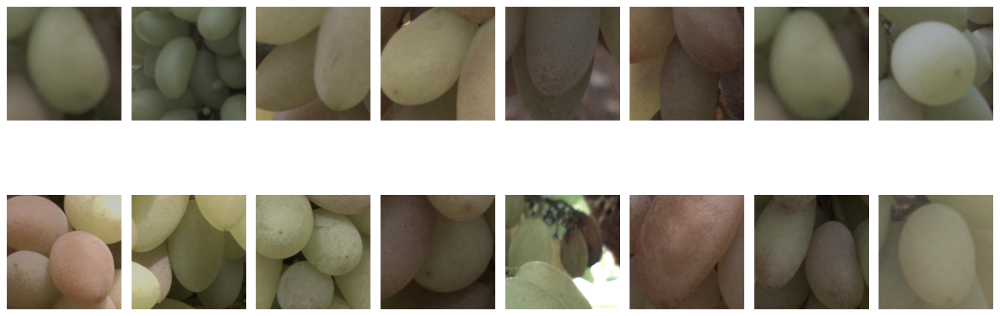

In [ ]:
class GrapeDataset(Dataset):
    def __init__(self, image_paths, transform=None):
        """
        Inizializza il dataset.

        :param image_paths: Lista dei percorsi delle immagini.
        :param transform: Trasformazioni da applicare alle immagini.
        """
        # Salva i percorsi delle immagini
        self.image_paths = image_paths
        # Salva le trasformazioni da applicare
        self.transform = transform

    def __len__(self):
        """
        Restituisce il numero totale di immagini nel dataset.
        """
        return len(self.image_paths)

    def __getitem__(self, index):
        """
        Carica e restituisce un'immagine e la sua etichetta in base all'indice fornito.

        :param index: Indice dell'immagine da ottenere.
        :return: Una tupla contenente l'immagine trasformata e la sua etichetta.
        """
        image_path = self.image_paths[index]   # Ottieni il percorso dell'immagine
        image = Image.open(image_path).convert('RGB')  # Converti in RGB per sicurezza

        if self.transform:
            image = self.transform(image) # Applica le trasformazioni se presenti
        # Restituisce l'immagine trasformata
        return image

# Funzione per caricare i percorsi delle immagini
def load_image_paths(root_dir):
    image_paths = []  # Restituisce l'immagine trasformata
    for subdir in ['NORMALI', 'ANOMALI']:
        folder_path = os.path.join(root_dir, subdir)
        for file in os.listdir(folder_path):
            if file.endswith(('.jpg', '.png')):
                image_paths.append(os.path.join(folder_path, file))   # Aggiungi il percorso dell'immagine alla lista
    return image_paths  # Restituisce la lista dei percorsi delle immagini

# Definizione delle trasformazioni
data_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((320, 320), antialias=True),
])

# Caricamento dei percorsi delle immagini e creazione del dataset
data_dir = "/content/drive/My Drive/PRIMO"
image_paths = load_image_paths(data_dir)
dataset = GrapeDataset(image_paths, transform=data_transform)
print(len(dataset)) # Stampa il numero totale di immagini nel dataset

# Creazione del dataloader
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

# Caricamento di un batch di immagini dal dataloader
dataiter = iter(dataloader)
images = next(dataiter)

# Visualizzazione delle immagini utilizzando matplotlib
fig, axs = plt.subplots(2, 8, figsize=(15, 7))
for idx, ax in enumerate(axs.ravel()):
    ax.imshow(images[idx].numpy().transpose(1, 2, 0))
    ax.axis('off')

plt.tight_layout()
plt.show()

# Definisco il modello che verrà addestrato
1. Classe UpConv:
Un blocco di upsampling che utilizza convoluzioni, normalizzazione batch, attivazione LeakyReLU e dropout per elaborare e incrementare la risoluzione dei dati in ingresso, riducendo prima temporaneamente la profondità dei canali per efficienza computazionale.

2. Classe BottleneckConv:
Un blocco che comprime e poi espande i dati attraverso convoluzioni, utilizzato per migliorare l'efficienza della rete e per ridurre l'overfitting, mantenendo costanti le dimensioni spaziali. Utilizza ReLU per l'attivazione.

3. Classe UResNet:
Un'architettura di rete neurale che combina un codificatore basato su ResNet (con diversi livelli a scelta e opzione di pesi preaddestrati) e un decodificatore personalizzato composto da blocchi UpConv e BottleneckConv. La rete esegue codifica, decodifica, e applica una convoluzione finale per generare l'immagine di output, sfruttando connessioni residue e tecniche avanzate per stabilizzare e accelerare l'addestramento, oltre a migliorare la generalizzazione.







In [ ]:
class UpConv(nn.Module):

    def __init__(self, in_ch, out_ch, scale=2):
        super(UpConv, self).__init__()
        neck_ch = in_ch // 4
        self.up_conv = nn.Sequential(
            nn.Upsample(scale_factor=scale),
            nn.Conv2d(in_channels=in_ch, out_channels=neck_ch,
                      kernel_size=1, bias=False),
            nn.BatchNorm2d(neck_ch),
            nn.LeakyReLU(negative_slope=0.01, inplace=True),
            nn.Dropout(p=0.3),
            nn.Conv2d(in_channels=neck_ch, out_channels=neck_ch,
                      kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(neck_ch),
            nn.LeakyReLU(negative_slope=0.01, inplace=True),
            nn.Dropout(p=0.3),
            nn.Conv2d(in_channels=neck_ch, out_channels=out_ch,
                      kernel_size=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.LeakyReLU(negative_slope=0.01, inplace=True),
            nn.Dropout(p=0.3)
        )

    def forward(self, x):
        x = self.up_conv(x)
        return x


class BottleneckConv(nn.Module):

    def __init__(self, in_ch, out_ch, stride=1):
        super(BottleneckConv, self).__init__()
        neck_ch = in_ch // 4
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels=in_ch, out_channels=neck_ch,
                      kernel_size=1, bias=False),
            nn.BatchNorm2d(neck_ch),
            nn.LeakyReLU(negative_slope=0.01, inplace=True),
            nn.Dropout(p=0.3),
            nn.Conv2d(in_channels=neck_ch, out_channels=neck_ch,
                      kernel_size=3, stride=stride, padding=1, bias=False),
            nn.BatchNorm2d(neck_ch),
            nn.LeakyReLU(negative_slope=0.01, inplace=True),
            nn.Dropout(p=0.3),
            nn.Conv2d(in_channels=neck_ch, out_channels=out_ch,
                      kernel_size=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.LeakyReLU(negative_slope=0.01, inplace=True),
            nn.Dropout(p=0.3)
        )

    def forward(self, x):
        x = self.conv(x)
        return x


class UResNet(nn.Module):
    def __init__(self, output_channels=3, pretrained=True, restnet_version='resnet50'):
        super(UResNet, self).__init__()
        weights = None
        if pretrained:
            weights = 'DEFAULT'
        # ==================================================================
        # ENCODER
        # ==================================================================
        # select resnet version
        if restnet_version == 'resnet18':
            base_model = models.resnet18(weights=weights)
        elif restnet_version == 'resnet34':
            base_model = models.resnet34(weights=weights)
        elif restnet_version == 'resnet50':
            base_model = models.resnet50(weights=weights)
        elif restnet_version == 'resnet101':
            base_model = models.resnet101(weights=weights)
        elif restnet_version == 'resnet152':
            base_model = models.resnet152(weights=weights)
        else:
            raise ValueError("Invalid resnet version")
        # extract layers from resnet
        self.initial_conv = nn.Sequential(
            base_model.conv1,
            base_model.bn1,
            base_model.relu
        )
        self.pool = base_model.maxpool

        self.encoder_list = nn.ModuleList()
        for layer in [base_model.layer1, base_model.layer2, base_model.layer3, base_model.layer4]:
            self.encoder_list.append(layer)
        if restnet_version == 'resnet18' or restnet_version == 'resnet34':
            self.bottleneck = BottleneckConv(512, 1024, stride=2)
        else:
            self.bottleneck = BottleneckConv(2048, 4096, stride=2)

        # ==================================================================
        # DECODER
        # ==================================================================
        self.decoder_list = nn.ModuleList()
        # decoder layers
        if restnet_version == 'resnet18' or restnet_version == 'resnet34':
            features = [512, 256, 128, 64]
        else:
            features = [2048, 1024, 512, 256]
        # add upsampling and bottleneck layers corresponding to the four encoder layers
        for i in range(len(features)):
            self.decoder_list.append(UpConv(features[i]*2, features[i]))
            self.decoder_list.append(BottleneckConv(features[i] * 2, features[i]))
        # add upsampling and bottleneck layers corresponding to the last encoder layer
        if restnet_version == 'resnet18' or restnet_version == 'resnet34':
            self.decoder_list.append(UpConv(64, 32))
            self.decoder_list.append(BottleneckConv(96, 64))
        else:
            self.decoder_list.append(UpConv(256, 64))
            self.decoder_list.append(BottleneckConv(128, 64))

        # final upsampling and convolutions
        self.final_conv =  nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(64, output_channels, kernel_size=1)
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x, sc = self.encode(x)
        x = self.decode(x, sc)
        return x

    def encode(self, x):
        skip_connections = list()
        # encoding
        x = self.initial_conv(x)
        skip_connections.append(x)
        x = self.pool(x)

        for layer in self.encoder_list:
            x = layer(x)
            skip_connections.append(x)

        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]
        return x, skip_connections

    def decode(self, x, skip_connections):
        # decoding
        for i in range(0, len(self.decoder_list), 2):
            x = self.decoder_list[i](x)
            skip_connection = skip_connections[i//2]
            if skip_connection.shape != x.shape:
                x = TF.resize(x, size=skip_connection.shape[2:])
            x = torch.cat([skip_connection, x], dim=1)
            x = self.decoder_list[i+1](x)

        x = self.final_conv(x)

        return x

**Funzioni Ausiliarie**

Qui dentro sono presenti alcune funzioni che mi aiuteranno durante la fase di addestramento tra cui quella che mi mostrerà le 2 curve e quella che mi mostrerà le immagini con la loro previsione del modello

In [ ]:
#Questa funzione visualizza le immagini originali e le loro ricostruzioni generate da un modello di autoencoder.
def show_reconstructions(model, data_loader, num_batches=1):
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    # Carica il modello sul dispositivo
    model.to(device)
    model.eval()
    dataiter = iter(data_loader)  # Crea un iteratore per il dataloader
    for _ in range(num_batches):  # Itera per il numero specificato di batch
        original_images = next(dataiter)  # Ottieni il prossimo batch di immagini
        original_images = original_images.to(device)  # Trasferisci le immagini al dispositivo
        with torch.no_grad():  # Disabilita il calcolo del gradiente
            reconstructions = model(original_images)  # Ottieni le immagini ricostruite dal modello
        comparison = torch.cat([original_images.cpu(), reconstructions.cpu()])  # Concatena immagini originali e ricostruzioni per la visualizzazione
        plt.figure(figsize=(15,15))
        plt.axis("off")
        plt.title("Original Images (Top) vs Reconstructed Images (Bottom)")
        plt.imshow(vutils.make_grid(comparison, nrow=original_images.size(0), padding=2, normalize=False).permute(1, 2, 0))
    plt.show()

def plot_training_validation_losses(training_losses, validation_losses):
    """
    Plotta le curve delle loss di training e validation.

    :param training_losses: Lista delle loss di training per ogni epoca.
    :param validation_losses: Lista delle loss di validation per ogni epoca.
    """
    plt.figure(figsize=(10, 5))
    plt.plot(training_losses, label='Training Loss')
    plt.plot(validation_losses, label='Validation Loss')
    plt.title('Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

def show_images_batch(images, title):
    """Mostra un batch di immagini utilizzando matplotlib."""
    # Crea una griglia di immagini e converti in formato numpy per visualizzazione
    grid = vutils.make_grid(images, nrow=8, padding=2, normalize=False)
    plt.figure(figsize=(15, 15))
    plt.imshow(grid.cpu().numpy().transpose(1, 2, 0))
    plt.title(title)
    plt.axis('off')
    plt.show()

# Creazione dei DataLoader
Questo punto è fondamentale per la creazione dei 4 Loader che verranno usati per le 3 fasi di Training, Validation e Test.
Il primo quello di Training sarà pari all'80% delle immagini buone, Validation e Test saranno il restante 20% divisi a metà.
L'ultimo ma non meno importante sarà il Loader di Test formato da solamente immagini etichettate come anormali.

In [ ]:
def prepare_data_loaders(
    directory_path: str,
    batch_size: int,
    training_split: float = 0.8,
    validation_split: float = 0.1,
    image_transforms: Optional[Callable] = None,
    test_transforms: Optional[Callable] = None,
    workers: int = 2,
    seed: int = 42,
) -> Tuple[DataLoader, DataLoader, DataLoader, DataLoader]:
    # Percorsi per le immagini 'normal' e 'abnormal'
    path_normal = os.path.join(directory_path, 'NORMALI')
    path_abnormal = os.path.join(directory_path, 'ANOMALI')

    # Caricamento delle immagini
    normal_images = [os.path.join(dp, f) for dp, dn, fn in os.walk(path_normal) for f in fn if f.endswith(('.jpg', '.png'))]
    abnormal_images = [os.path.join(dp, f) for dp, dn, fn in os.walk(path_abnormal) for f in fn if f.endswith(('.jpg', '.png'))]

    # Mescolanza e divisione delle immagini 'normal'
    if seed is not None:
        random.seed(seed)
        random.shuffle(normal_images)

    #Le immagini normali vengono mescolate e divise in set di training, validazione e test basandosi sulle frazioni specificate nei parametri training_split e validation_split
    total_normal = len(normal_images)
    train_end = int(total_normal * training_split)
    valid_end = train_end + int(total_normal * validation_split)

    training_images = normal_images[:train_end]
    validation_images = normal_images[train_end:valid_end]
    test_images_normal = normal_images[valid_end:]

    # Le immagini 'abnormal' vengono utilizzate solo per il test
    test_images_abnormal = abnormal_images

    # Creazione dei dataset
    train_dataset = GrapeDataset(training_images, transform=image_transforms)
    valid_dataset = GrapeDataset(validation_images, transform=image_transforms)
    test_normal_dataset = GrapeDataset(test_images_normal, transform=test_transforms)
    test_abnormal_dataset = GrapeDataset(test_images_abnormal, transform=test_transforms)

    # Creazione dei DataLoader
    train_loader = DataLoader(train_dataset, batch_size=batch_size, num_workers=workers, shuffle=True)
    valid_loader = DataLoader(valid_dataset, batch_size=batch_size, num_workers=workers, shuffle=False)
    test_normal_loader = DataLoader(test_normal_dataset, batch_size=batch_size, num_workers=workers, shuffle=False)
    test_abnormal_loader = DataLoader(test_abnormal_dataset, batch_size=batch_size, num_workers=workers, shuffle=False)

    return train_loader, valid_loader, test_normal_loader, test_abnormal_loader

**Funzioni di Trainig e Test**

Queste saranno le 2 funzioni usate per la fase di addestramento e test. La funzione di test eseguirà il test sia sul batch buono che quello cattivo

In [ ]:
def train_validate_model(model, train_loader, val_loader, criterion, optimizer, epochs, device):
    """
    Esegue il training e la validation del modello.

    :param model: Il modello da addestrare e validare.
    :param train_loader: DataLoader per il training.
    :param val_loader: DataLoader per la validation.
    :param criterion: Funzione di perdita.
    :param optimizer: Ottimizzatore.
    :param epochs: Numero di epoche di training.
    :param device: Dispositivo su cui eseguire il calcolo ('cuda' o 'cpu').
    """
    training_losses = []  # Lista per le loss di training
    validation_losses = []  # Lista per le loss di validation
    for epoch in range(epochs):
        model.train()
        train_loss = 0.0
        for inputs in train_loader:
            inputs = inputs.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, inputs)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        train_loss /= len(train_loader)
        training_losses.append(train_loss)

        val_loss = 0.0
        model.eval()
        with torch.no_grad():
            for inputs in val_loader:
                inputs = inputs.to(device)

                outputs = model(inputs)
                loss = criterion(outputs, inputs)
                val_loss += loss.item()
        val_loss /= len(val_loader)
        validation_losses.append(val_loss)
        print(f'Epoch {epoch+1}/{epochs}, Train Loss: {train_loss/len(train_loader)}, Validation Loss: {val_loss/len(val_loader)}')
        print("Reconstructed Images:")
        show_reconstructions(model, train_loader)
    return training_losses, validation_losses

def test_model(model, test_good_loader, test_bad_loader, criterion, device):
    """
    Esegue il test del modello sui set di test 'buoni' e 'cattivi'.

    :param model: Il modello da testare.
    :param test_good_loader: DataLoader per il test delle immagini 'buone'.
    :param test_bad_loader: DataLoader per il test delle immagini 'cattive'.
    :param criterion: Funzione di perdita.
    :param device: Dispositivo su cui eseguire il calcolo ('cuda' o 'cpu').
    """

    def test(loader, desc):
        model.eval()
        test_loss = 0.0

        with torch.no_grad():
            for i, data in enumerate(loader):
                data = data.to(device)
                outputs = model(data)
                loss = criterion(outputs, data)
                test_loss += loss.item()

                # Aggiungi una condizione per visualizzare solo il primo batch
                if i == 0:
                    # Visualizza immagini originali e ricostruzioni
                    show_images_batch(data, f'{desc} Original Images')
                    show_images_batch(outputs, f'{desc} Reconstructed Images')

        return test_loss / len(loader)

    loss_good = test(test_good_loader, 'Good')
    loss_bad = test(test_bad_loader, 'Bad')

    print(f'Test Loss on Good Images: {loss_good}, Test Loss on Bad Images: {loss_bad}')

# Addestramento del Modello
In questa sezione viene effettuato l'addestramento del modello ed a seguire il test delle performance.
Per ogni epoca viene stampato il valore della funzione di perdita sia in training che in validation ed in più viene preso un batch casuale dal loader di training e mostrato l'originale con sotto la ricostruzione.

Durante ogni epoca si può notare come il modello migliori sempre di più nel ricostruire i pattern ricorrenti dell'uva.

Definisco le trasformazioni dei batch in addestramento. Aggiungo un pò di rumore alle immagini per avere un pò di Data Augmentation.
Alla fine dell'addestramento poi verrà fatto il test del modello sia sul batch buono che cattivo, dal test analizzerò la loss reconstruction sia sul loader buono che cattivo confrontando i 2 risultati.

La scelta del batch size a 16 è stata ponderata dopo che con dei test a 8 mi sono accorto che avevo una convergenza più rapida ma anche molto più rumorosa e irregolare.

Le trasformazioni sono 2 dato che sul test non vorrò le "alterazioni" sulle immagini che ho in fase di addestramento come rotazioni o soprattutto alterazioni della luminosità e contrasto.



Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 156MB/s]


Epoch 1/20, Train Loss: 0.0015834191032010328, Validation Loss: 0.005421642408085366
Reconstructed Images:


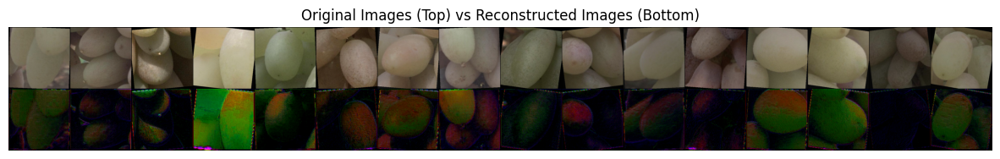

Epoch 2/20, Train Loss: 0.00117191438724792, Validation Loss: 0.004332060110755265
Reconstructed Images:


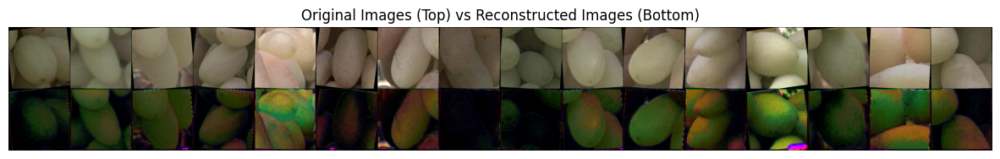

Epoch 3/20, Train Loss: 0.0009348602665610776, Validation Loss: 0.0031346402441461882
Reconstructed Images:


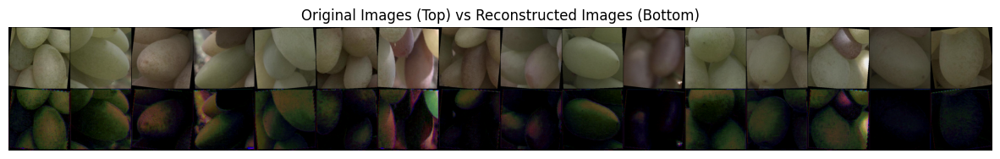

Epoch 4/20, Train Loss: 0.0007721316549819877, Validation Loss: 0.0022481122869066894
Reconstructed Images:


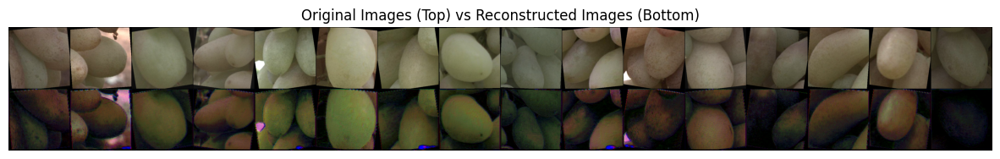

Epoch 5/20, Train Loss: 0.0006480608300378993, Validation Loss: 0.0019224247274299462
Reconstructed Images:


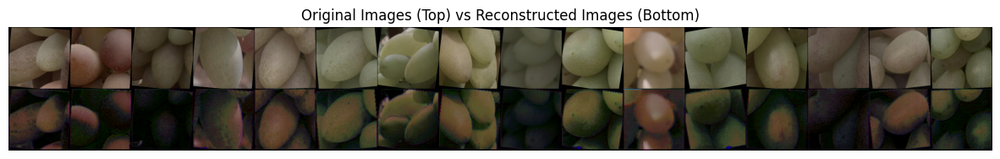

Epoch 6/20, Train Loss: 0.00055569003310526, Validation Loss: 0.0013819561120019192
Reconstructed Images:


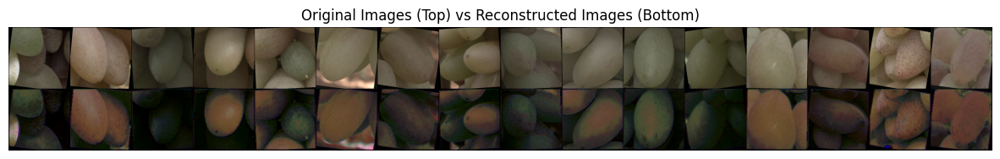

Epoch 7/20, Train Loss: 0.000476748574494381, Validation Loss: 0.0011550967238791701
Reconstructed Images:


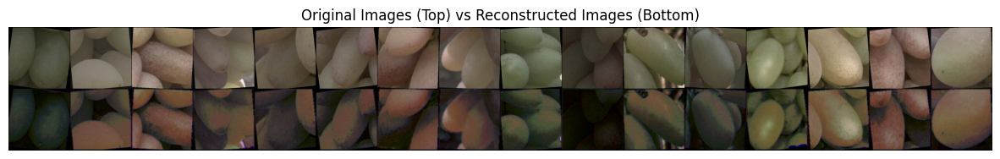

Epoch 8/20, Train Loss: 0.0004200330045197683, Validation Loss: 0.0009510572255951249
Reconstructed Images:


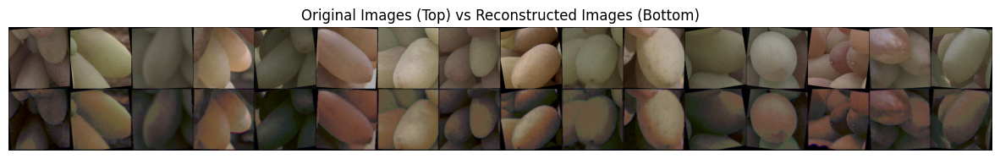

Epoch 9/20, Train Loss: 0.0003754486501689072, Validation Loss: 0.000793264624209971
Reconstructed Images:


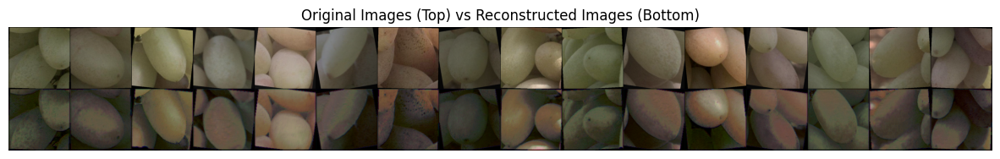

Epoch 10/20, Train Loss: 0.0003387209997391878, Validation Loss: 0.0006580477735648552
Reconstructed Images:


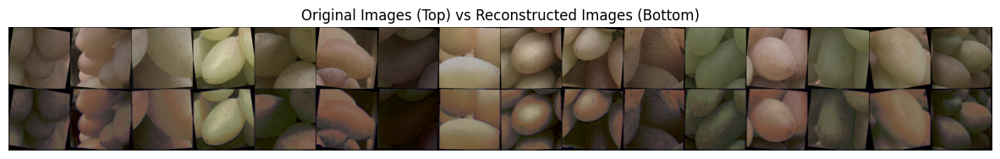

Epoch 11/20, Train Loss: 0.00030755484123109203, Validation Loss: 0.0005437333553951854
Reconstructed Images:


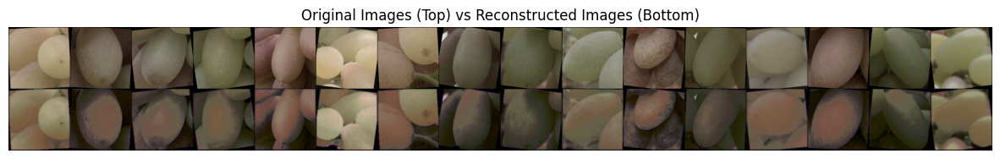

Epoch 12/20, Train Loss: 0.00028270711062204873, Validation Loss: 0.000489067043721055
Reconstructed Images:


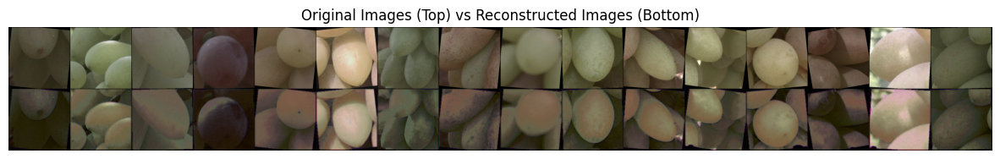

Epoch 13/20, Train Loss: 0.0002606240635505616, Validation Loss: 0.0006340893378364854
Reconstructed Images:


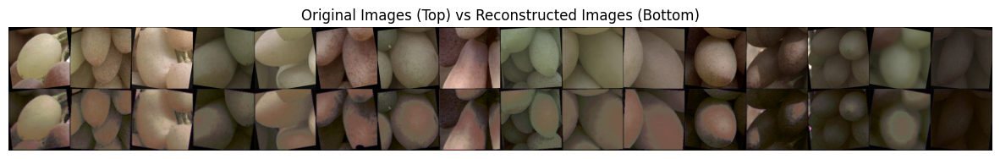

Epoch 14/20, Train Loss: 0.00024057620860747948, Validation Loss: 0.00041817747276379826
Reconstructed Images:


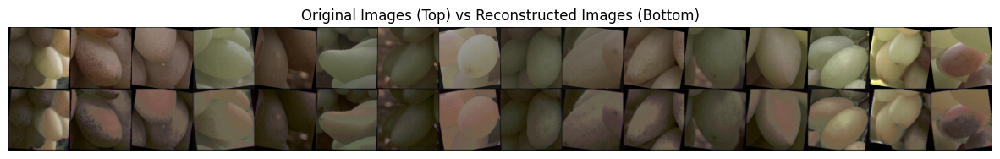

Epoch 15/20, Train Loss: 0.00022651722484626243, Validation Loss: 0.0003823042376704204
Reconstructed Images:


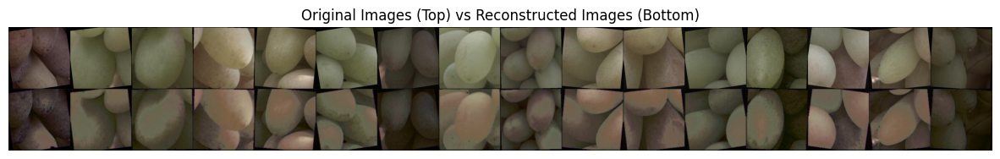

Epoch 16/20, Train Loss: 0.00021161684483908132, Validation Loss: 0.00037927755976044055
Reconstructed Images:


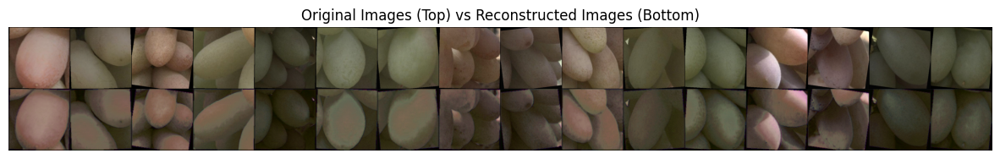

Epoch 17/20, Train Loss: 0.00019819948501922314, Validation Loss: 0.0003035769105837163
Reconstructed Images:


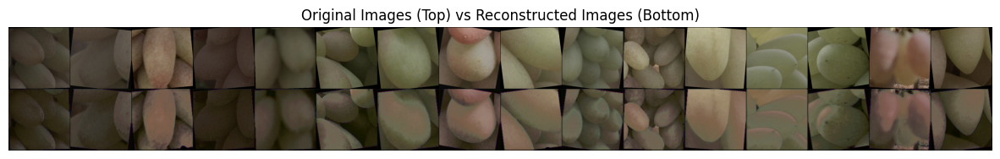

Epoch 18/20, Train Loss: 0.00018559503529482952, Validation Loss: 0.000305370710217782
Reconstructed Images:


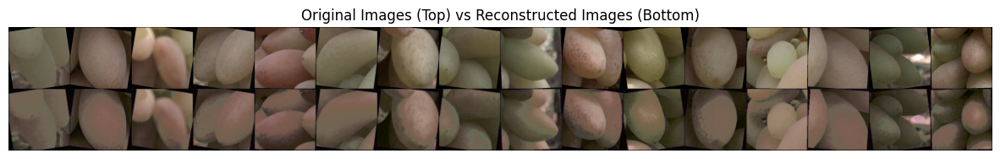

Epoch 19/20, Train Loss: 0.00017527884582554847, Validation Loss: 0.0003851052052697115
Reconstructed Images:


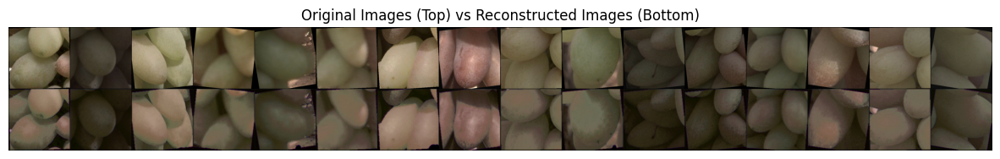

Epoch 20/20, Train Loss: 0.0001664675445112853, Validation Loss: 0.00023594918982578546
Reconstructed Images:


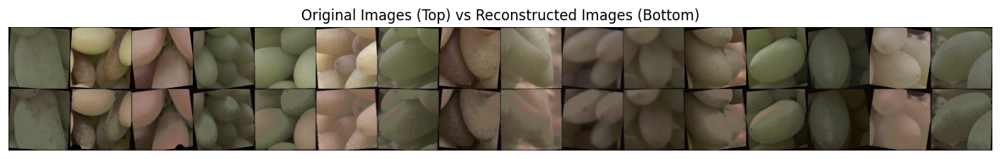

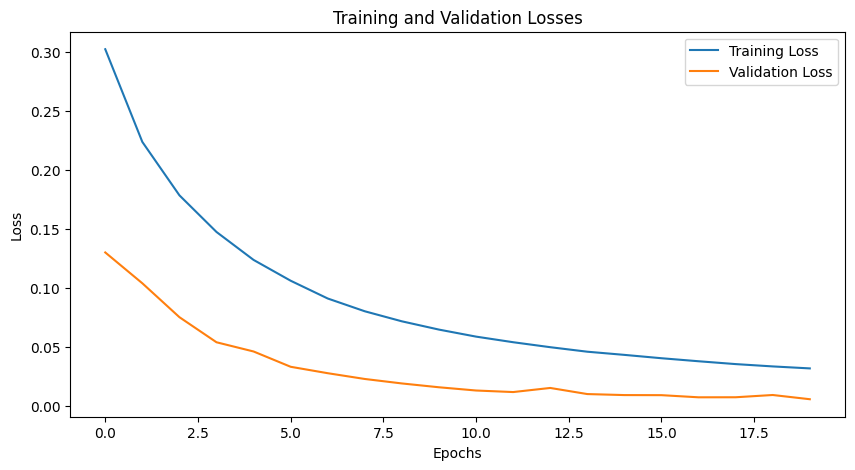

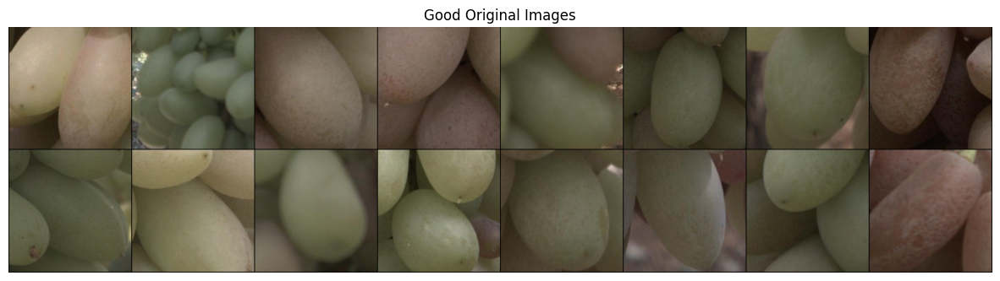

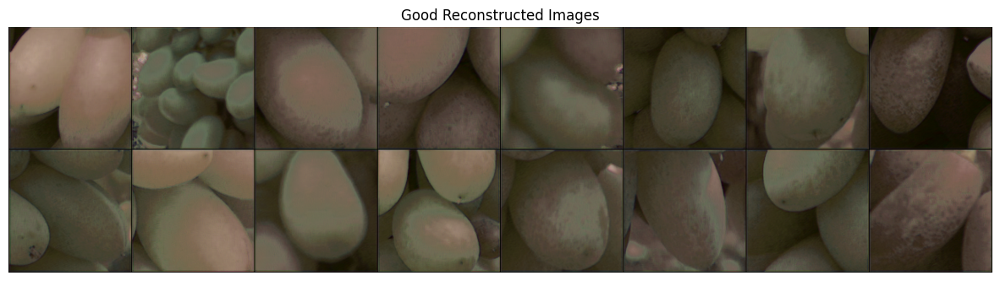

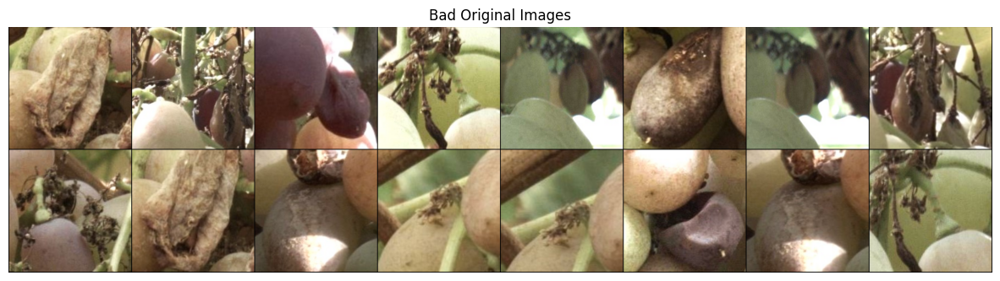

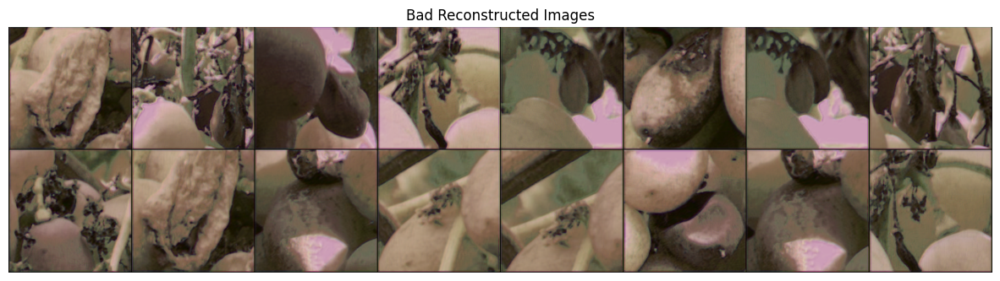

Test Loss on Good Images: 0.003655895464665567, Test Loss on Bad Images: 0.013782354909926653


In [ ]:
# Definizione delle trasformazioni
data_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((320, 320), antialias = True),
    transforms.RandomHorizontalFlip(p=0.2),
    transforms.RandomRotation(degrees=10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2)
])

test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((320, 320), antialias = True),
])

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


# Creazione del modello U-Net con i parametri specificati
model = UResNet().to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-5, weight_decay=1e-2)
epochs=20

train_loader, val_loader, test_good_loader, test_bad_loader = prepare_data_loaders(
    directory_path="/content/drive/My Drive/PRIMO",
    batch_size=16,
    image_transforms=data_transform,
    test_transforms=test_transform
)

# Chiama la funzione di training e validation
training_losses, validation_losses = train_validate_model(model, train_loader, val_loader, criterion, optimizer, epochs, device)
plot_training_validation_losses(training_losses, validation_losses)

# Chiama la funzione di testing
test_model(model, test_good_loader, test_bad_loader, criterion, device)

**Valutazioni Post-Addestramento**

Come ci aspettavamo e speravamo il modello si comporta meglio sulle immagini buone rispetto a quelle cattive; segno che almeno qualcosina ha imparato.
La convergenza delle 2 curve è stata buona, le loss di validation hanno avuto qualche sbalzo ma nulla di significativo, avrei potuto addestrare comunque la rete per ulteriori epoche. Dato che le loss di training e validation continuavano a scendere(in caso di overfitting avrei visto la validation salire e il training continuare a scendere), a 20 mi è sembrato un giusto compromesso

# Valutazione del Modello
Nel primo blocco sono presenti tutte le funzioni:
Collect losses calcola la perdita per ogni immagine del test set e la salva all'interno di una lista, in altre 2 liste poi vengono salvate le immagini originali e quelle ricostruite dal modello.

Calculate metrics calcola le metriche di performance del modello: TP, FP, TN FN
e li salva all'interno di una tupla.

Find best threshold trova la migliore soglia che massimizza il punteggio F1 del modello e calcola la matrice di confusione corrispondente, da questa funzione vengono fuori tutte le metriche che stabiliscono le performance del modello.
Come detto all'inizio la scelta della threshold è fondamentale poichè stabilirà quando un immagine è normale oppure no.

Plot mostra tutti le metriche di performance e la matrice di confusione

In [ ]:
def collect_losses(model, test_loader, criterion, device):
    """
    Raccoglie le loss per ogni immagine nel test_loader.
    :param model: Il modello da testare.
    :param test_loader: DataLoader per il test delle immagini.
    :param criterion: Funzione di perdita.
    :param device: Dispositivo su cui eseguire il calcolo ('cuda' o 'cpu').
    :return: Lista delle loss per ogni immagine.
    """
    model.eval()
    losses = []
    original_images = []
    reconstructed_images = []
    with torch.no_grad():
        for data in test_loader:
            inputs = data.to(device)
            outputs = model(inputs)

            # Calcola la perdita per ogni immagine nel batch invece che per l'intero batch
            for i in range(inputs.size(0)):
                loss = criterion(outputs[i:i+1], inputs[i:i+1]).item()
                losses.append(loss)

                # Salva l'immagine originale e la sua ricostruzione
                original_images.append(inputs[i].cpu())
                reconstructed_images.append(outputs[i].cpu())

    return losses, original_images, reconstructed_images

def calculate_metrics(
    positive_losses: List[float],
    negative_losses: List[float],
    cutoff: float,
) -> Tuple[int, int, int, int]:
    tp = sum(1 for loss in negative_losses if loss >= cutoff)
    fp = sum(1 for loss in positive_losses if loss >= cutoff)
    tn = sum(1 for loss in positive_losses if loss < cutoff)
    fn = sum(1 for loss in negative_losses if loss < cutoff)
    return tp, fp, tn, fn

def find_best_threshold(
    positive_losses: List[float],
    negative_losses: List[float],
    thresholds: List[float]
) -> Tuple[float, float, Tuple[int, int, int, int], Tuple[float, float, float, float]]:
    best_f1 = -1
    best_metrics = None
    best_threshold = None
    best_confusion_matrix = None

    for threshold in thresholds:
        tp, fp, tn, fn = calculate_metrics(positive_losses, negative_losses, threshold)
        precision = tp / (tp + fp) if (tp + fp) != 0 else 0
        recall = tp / (tp + fn) if (tp + fn) != 0 else 0
        f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) != 0 else 0
        accuracy = (tp + tn) / (tp + tn + fp + fn) if (tp + tn + fp + fn) != 0 else 0

        if f1 > best_f1:
            best_f1 = f1
            best_threshold = threshold
            best_confusion_matrix = (tp, fp, tn, fn)
            best_metrics = (accuracy, precision, recall, f1)

    return best_threshold, best_f1, best_confusion_matrix, best_metrics

def plot_confusion_matrix_and_metrics(confusion_matrix: Tuple[int, int, int, int], metrics: Tuple[float, float, float, float]):
    accuracy, precision, recall, f1 = metrics
    sns.heatmap([[confusion_matrix[0], confusion_matrix[1]], [confusion_matrix[2], confusion_matrix[3]]],
                annot=True, fmt="d", cmap="Blues")
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

    print("True Positives:", confusion_matrix[0])
    print("False Positives:", confusion_matrix[1])
    print("True Negatives:", confusion_matrix[2])
    print("False Negatives:", confusion_matrix[3])
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)

def show_images(indices, title, original_images, reconstructed_images, device):
    num_images_to_show = 10  # Limita il numero di immagini da mostrare
    indices = indices[:num_images_to_show]  # Prendi solo le prime N immagini
    num_images = len(indices)
    cols = num_images
    rows = 2  # Due righe per ogni coppia di immagini (originale e ricostruita)

    plt.figure(figsize=(cols * 3, rows * 3))
    plt.suptitle(title)

    for count, idx in enumerate(indices):
        plt.subplot(rows, cols, count + 1)
        original_img = original_images[idx].permute(1, 2, 0).squeeze()
        plt.imshow(original_img)
        plt.title("Original")
        plt.axis('off')

        plt.subplot(rows, cols, count + 1 + cols)
        reconstructed_img = reconstructed_images[idx].permute(1, 2, 0).squeeze()
        plt.imshow(reconstructed_img)
        plt.title("Reconstructed")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

def show_false_positives_negatives(original_images, reconstructed_images, losses, threshold, labels, device):
    false_positives = [i for i, (loss, label) in enumerate(zip(losses, labels)) if loss >= threshold and label == 0]
    false_negatives = [i for i, (loss, label) in enumerate(zip(losses, labels)) if loss < threshold and label == 1]
    true_positives = [i for i, (loss, label) in enumerate(zip(losses, labels)) if loss >= threshold and label == 1]
    true_negatives = [i for i, (loss, label) in enumerate(zip(losses, labels)) if loss < threshold and label == 0]

    if false_positives:
        show_images(false_positives, "False Positives", original_images, reconstructed_images, device)
    if false_negatives:
        show_images(false_negatives, "False Negatives", original_images, reconstructed_images, device)
    if true_positives:
        show_images(true_positives, "True Positives", original_images, reconstructed_images, device)
    if true_negatives:
        show_images(true_negatives, "True Negatives", original_images, reconstructed_images, device)

**Calcolo tutti i valori usando le funzioni sopra:**
*   Threshold
*   F1 score
*   Matrice di Confusione
*   Precision, Accuracy e Recall

L'F1 Score è una misura che combina Precision e Recall in un unico valore, offrendo un equilibrio tra queste due metriche. È particolarmente utile quando le classi sono sbilanciate.Un F1 Score elevato indica che il modello ha un buon equilibrio tra precisione e richiamo.

La Precision misura la frazione delle identificazioni positive che sono effettivamente corrette. È definita come il numero di veri positivi diviso per il numero di veri positivi più il numero di falsi positivi
Una precisione elevata indica che la maggior parte delle etichette assegnate dal modello come positive sono corrette.

L'Accuracy misura la frazione di predizioni corrette, sia positive che negative, rispetto al totale delle predizioni. L'accuracy è utile quando le classi sono bilanciate, ma può essere fuorviante quando le classi sono sbilanciate.

Il Recall misura la frazione dei positivi reali che sono stati identificati correttamente. È definito come il numero di veri positivi diviso per il numero di veri positivi più il numero di falsi negativi.
Un recall elevato indica che il modello è capace di identificare la maggior parte dei casi positivi.

381
150
10000
Miglior soglia: 0.007445544554455446
Miglior punteggio F1: 0.9230769230769231


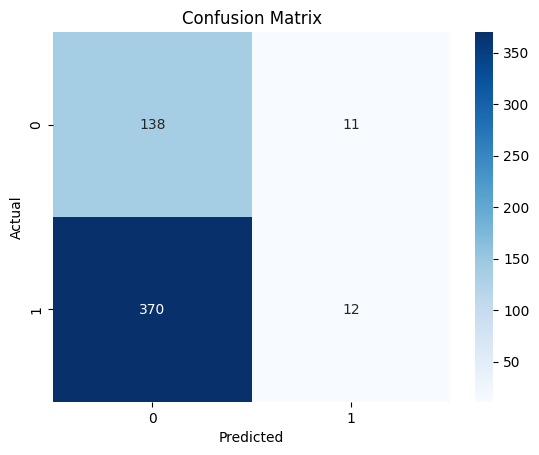

True Positives: 138
False Positives: 11
True Negatives: 370
False Negatives: 12
Accuracy: 0.9566854990583804
Precision: 0.9261744966442953
Recall: 0.92
F1 Score: 0.9230769230769231


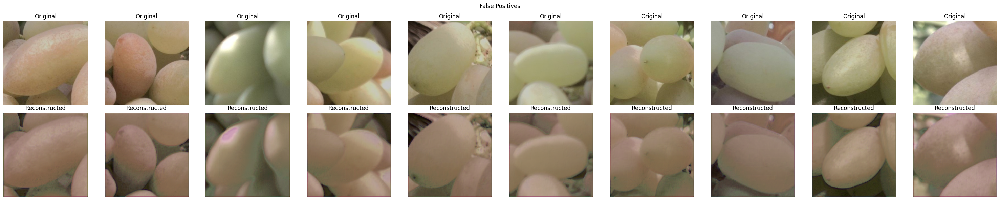

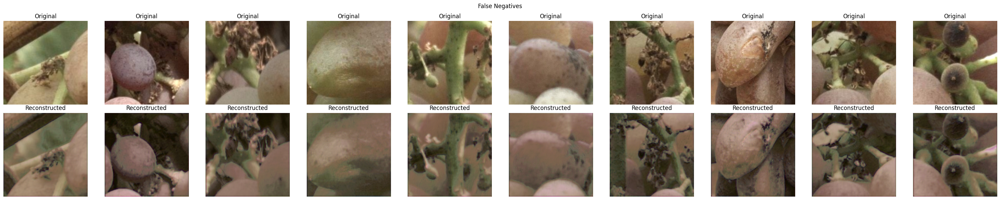

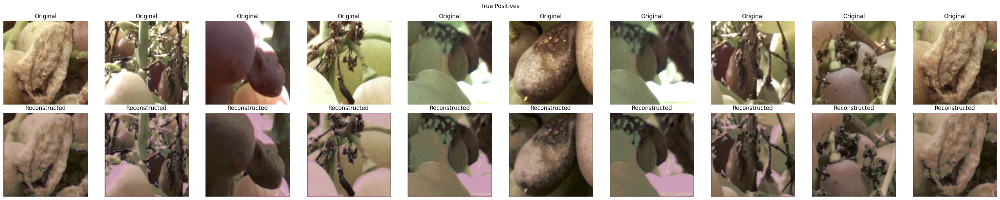

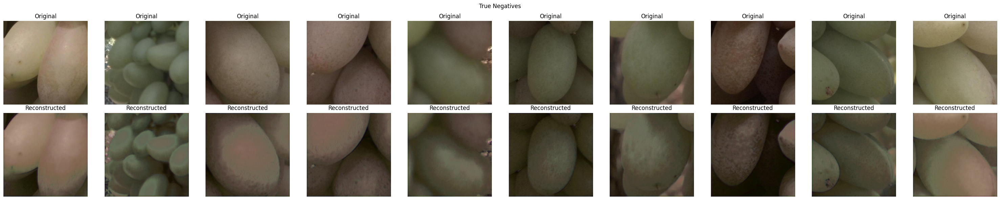

In [ ]:
#good_losses = collect_losses(model, test_good_loader, criterion, device)
#bad_losses = collect_losses(model, test_bad_loader, criterion, device)

good_losses, good_orig_images, good_recons = collect_losses(model, test_good_loader, criterion, device)
bad_losses, bad_orig_images, bad_recons = collect_losses(model, test_bad_loader, criterion, device)
print(len(good_losses))
print(len(bad_losses))

# Viene creato un array numpy che contiene 10000 valori
thresholds = np.linspace(0.002, 0.2, 10000)
print(len(thresholds))

best_threshold, best_f1, best_confusion_matrix, best_metrics = find_best_threshold(good_losses, bad_losses, thresholds)

print("Miglior soglia:", best_threshold)
print("Miglior punteggio F1:", best_f1)
plot_confusion_matrix_and_metrics(best_confusion_matrix, best_metrics)

total_losses = good_losses + bad_losses
total_originals = good_orig_images + bad_orig_images
total_reconstructed = good_recons + bad_recons
total_labels = [0] * len(good_losses) + [1] * len(bad_losses) # 0 per 'good', 1 per 'bad'
show_false_positives_negatives(total_originals, total_reconstructed, total_losses, best_threshold, total_labels, device)

# **CONSIDERAZIONI**
Il modello si comporta molto bene in contesti di bassa luminosità o meglio. Tende a fare previsioni errate in caso di immagini con variazioni improvvise di luminosità. In questi casi nota nell'immagine un cambiamento grande nell'intensità dei pixel ed in alcuni casi segnalare l'anomalia. Ho provato molti test per mitigare questo fatto ed oltre questo livello non sono arrivato. Ho inserito all'interno del dataset sia immagini scure che luminose con picchi, in più ho effettuato un pò di data augmentation inserendo, oltre a un pò di rumore, modifiche che in modo randomico modifichino luminosità e contrasto nei batch. Con un valore più alto avrei poi distorsione nelle immagini.
Questo fatto si può osservare bene dai falsi positivi che molti hanno errori dovuti a luminosità.

Come metrica su cui poi stabilire la threshold ho preso F1 Score poichè essendo le classi sbilanciate è la metrica che fornisce un parametro bilanciato da cui poi valutare le performance del modello

# Salvo il mio modello

Salvo all'interno del drive sia le statistiche che l'intero modello

In [ ]:
# Definisci il percorso della directory
directory = '/content/drive/My Drive/model'

# Crea la directory se non esiste
if not os.path.exists(directory):
    os.makedirs(directory)

# Ottieni il timestamp corrente e formattalo
current_time = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')

# Crea il nome del file con il timestamp
file_name = f'model_{current_time}.pth'

# Salva il modello nel percorso specificato con il timestamp nel nome del file
model_path = os.path.join(directory, file_name)
torch.save(model.state_dict(), model_path)

# Se vuoi salvare l'intero modello, non solo lo state_dict
full_model_path = os.path.join(directory, f'model_complete_{current_time}.pth')
torch.save(model, full_model_path)

# Considerazioni Finali
Il modello in generale ha raggiunto un F1 score che si attesta sullo 0.90, in questo caso è leggermente più basso ma durante i test è stato superato più volte.
Indubbiamente le performance sono migliorabili ancora, sicuramente aumentando il dataset con più foto e aggiustando di conseguenza gli hyperparametri e aggiungendo regolarizzazione. Ma come ben sappiamo l'uva non esce fuori in inverno ;)
Sono sicuro che con un pò di limitazioni sia temporali: addestramento lento e dataset le prestazioni possano essere ancora migliori.
Il modello, osservando anche la matrice di confusione, riesce a fare previsioni accurate di più verso osservazioni normali, con osservazioni anomale è generalmente meno preciso